In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Make matplotlib figures appear inline in the
# notebook rather than in a new window
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

def display(img, title=None):
    # Show image
    plt.figure(figsize = (15,15))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [10]:
from skimage import io, color
def load(image_path):
    """Loads an image from a file path, returning a numpy array of shape(image_height, image_width, 3).
    """
    out = io.imread(image_path)
    return out

In [7]:
from skimage import feature

For my final project I decided to work on making a paper scanner. I've used these phone apps a lot in the past for turning in homework and scanning papers easily so I wanted to see how I could explore these apps' computer vision aspect. The way it works is that you take a photo of the paper you want to scan, and then usually it automatically detects the corners of the paper in the image, and lets you adjust them, and then it rotates and skews that paper into a rectange and makes it black & white so it comes out looking like a scan that you put in a flatbed scanner. Here is an example of some math homework I scanned (different pages).

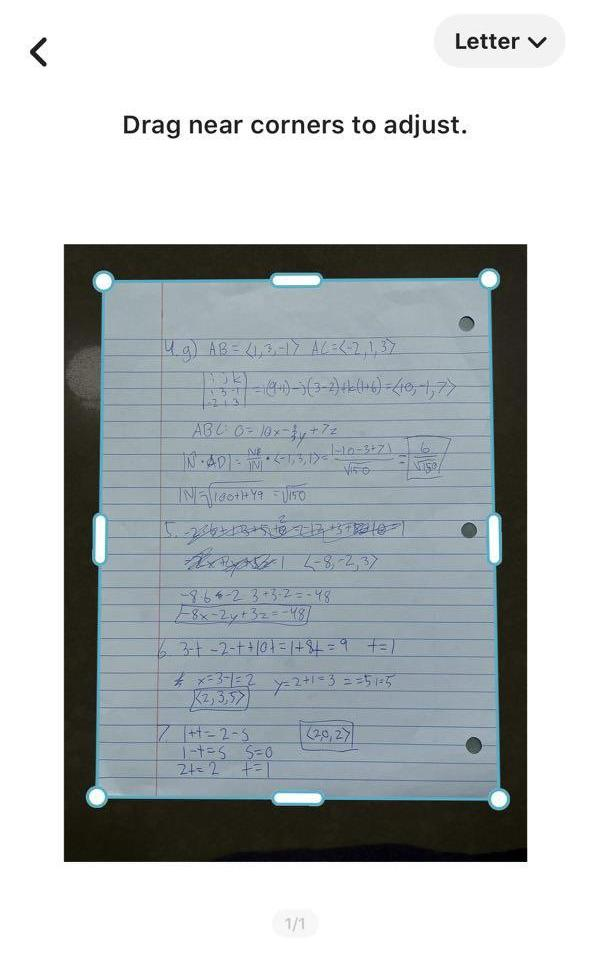

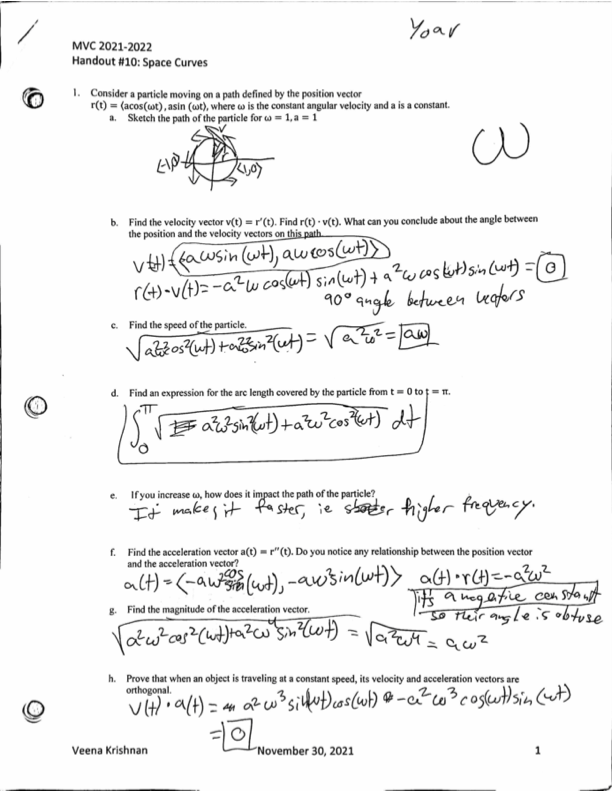

I was most interested in the feature where it finds the corners automatically, and I thought there was a lot of potential for computer vision exploration there, however, I ended up just making a whole scanner from scratch.

I began with the idea that I could use corner detection to find the corners of the paper and then connect them, but after working with it for my previous project I realized that corner detection is more for fine details than large corners. I did some research online and found a [stack overflow page](https://stackoverflow.com/questions/6555629/algorithm-to-detect-corners-of-paper-sheet-in-photo) which from then on guided my exploration in this project.

In the page they discuss a few different approaches, however all of them started with finding the edges in the image. For that I used canny.

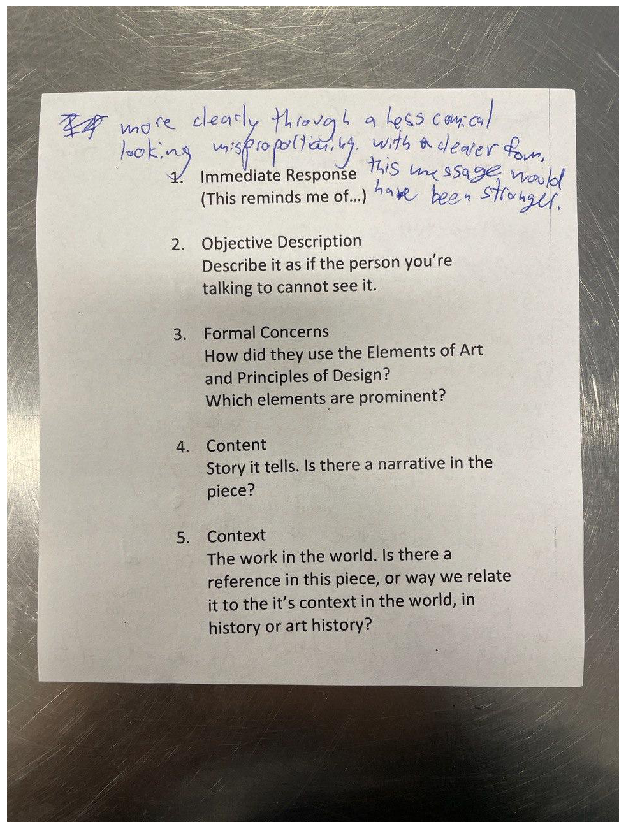

In [28]:
image = load('../FeatureDetection/CornerImages/photo_2021-11-05_11-06-41.jpg')
display(image)

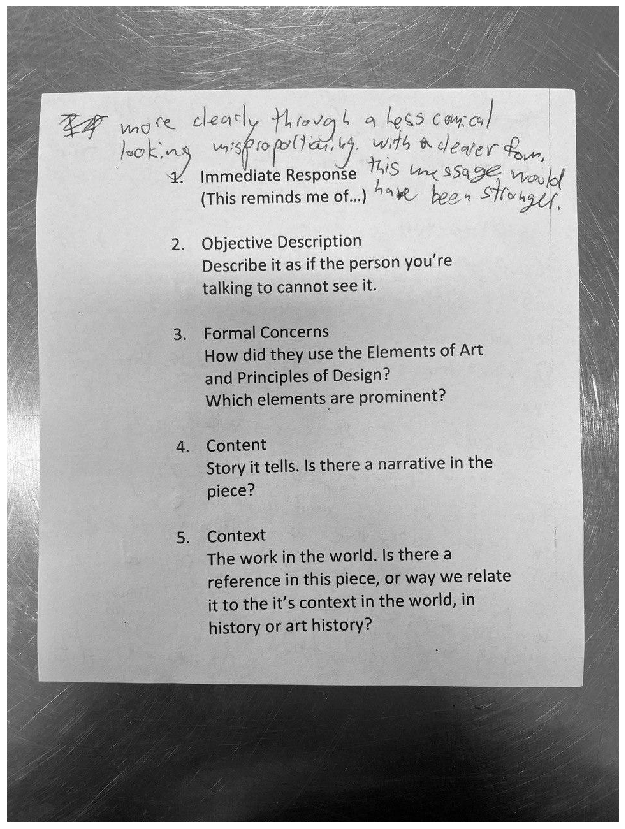

In [18]:
gray_image = color.rgb2gray(image)
display(gray_image)

In [20]:
gray_image = gray_image*255

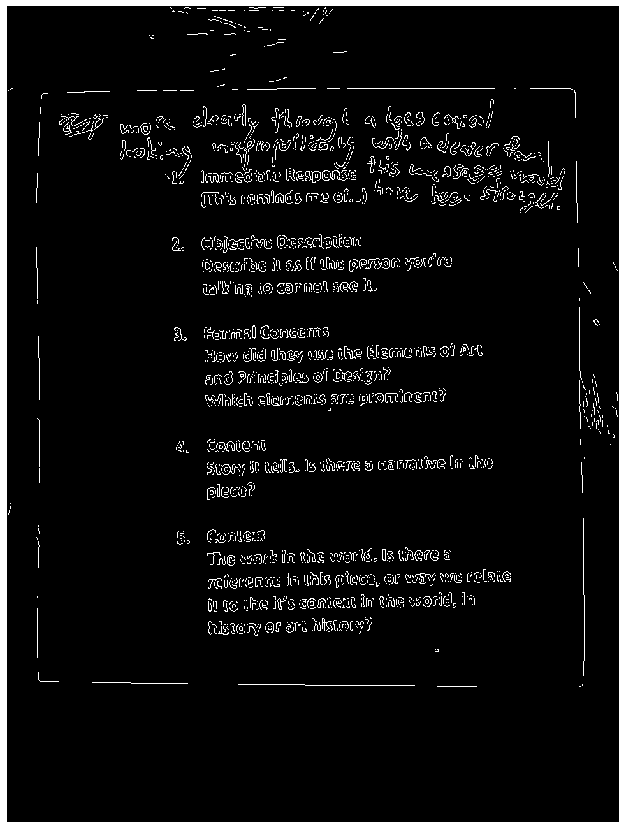

In [26]:
edge_image = feature.canny(gray_image, sigma=2, low_threshold=30, high_threshold=50)
display(edge_image)

Someone on the page also recommended using a median filter to remove the text, and to my surprise this worked extremely well!

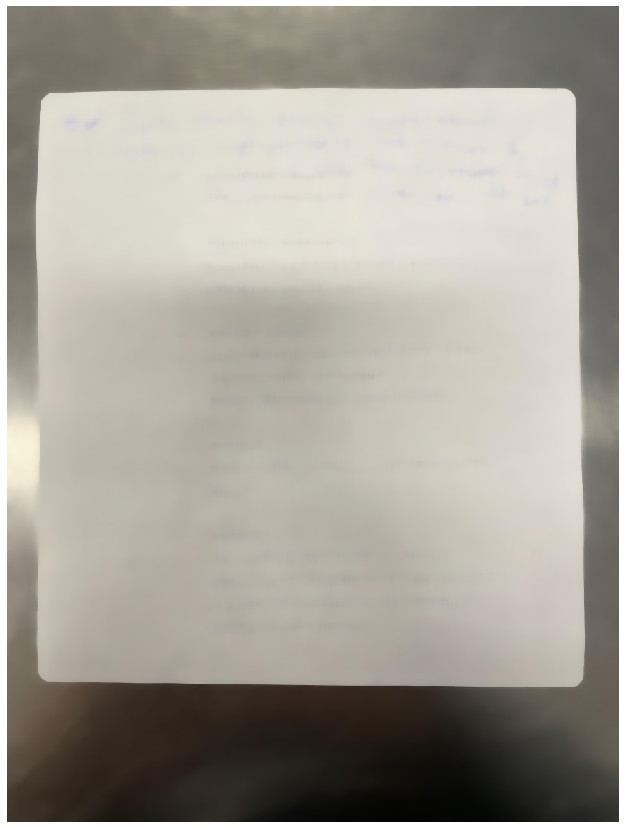

In [120]:
# https://stackoverflow.com/questions/18427031/median-filter-with-python-and-opencv

blurred = cv2.medianBlur(image, 25)
display(blurred)

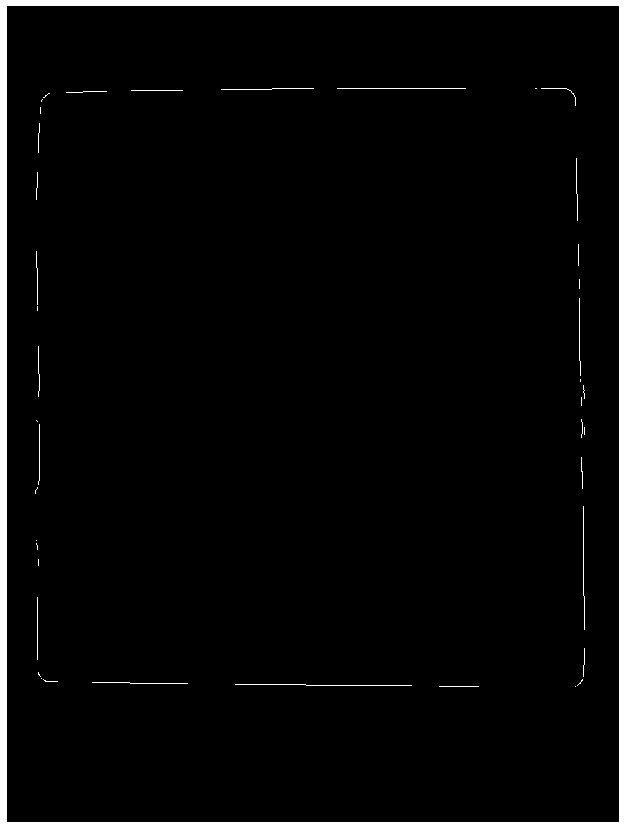

In [100]:
gray_blurred = color.rgb2gray(blurred) * 255
edge_blurred = feature.canny(gray_blurred, sigma=0, low_threshold=20, high_threshold=40)
display(edge_blurred)

The dilating was to test if I could close the broken edges, but this didn't work out because some of the edges were just too large.

In [134]:
# https://answers.opencv.org/question/230859/opencv-does-not-detect-the-my-rectangle/
thresh = cv2.dilate(np.uint8(edge_blurred),None,iterations = 40)
thresh = cv2.erode(thresh,None,iterations = 40)

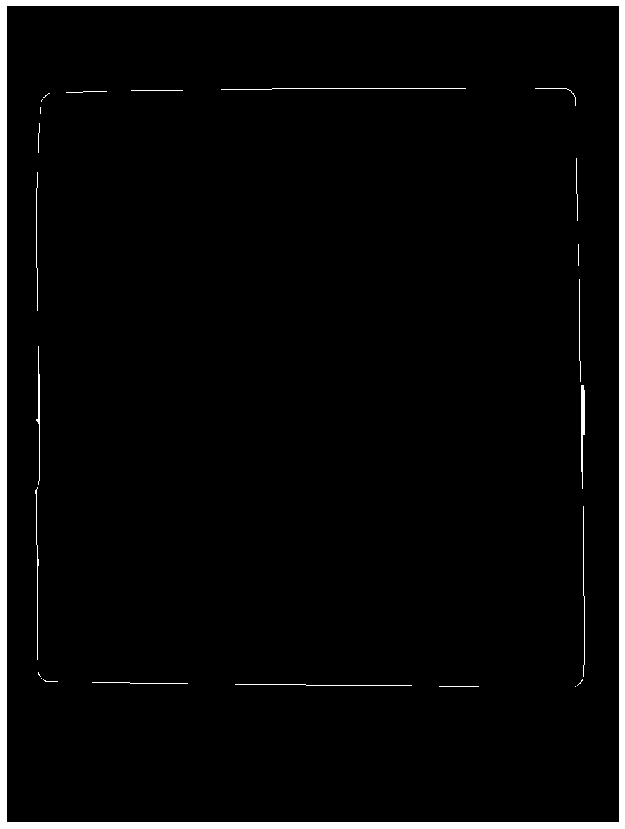

In [137]:
display(thresh)

The first method discussed on the page was finding the contour of the edge. This would provide a shape which I could then fit a polygon or rectangle to, and from there find the corners. However, the contour method is problematic for one big reason: it's really difficult to use if you have broken edges. You'll get multiple contours and dealing with multiple contours is hard.

EDIT: Looking back, the dilation actually did solve the problem of broken edges for this image. However, it would probably be very unreliable with a wide variety of other images that exist, and it's simply less elegant than the hough transform method.

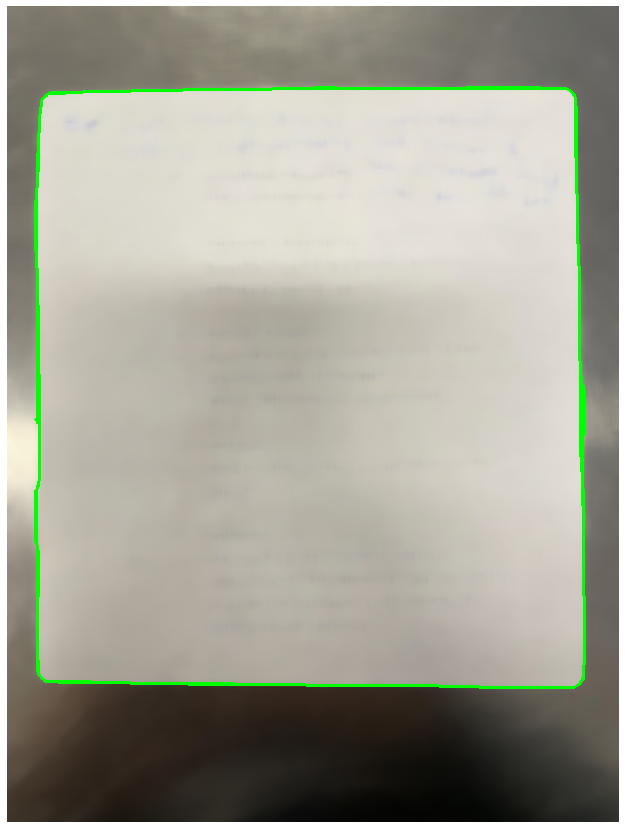

In [315]:
conts2, _ = cv2.findContours(np.uint8(thresh), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
display(cv2.drawContours(copy.copy(cv2.medianBlur(image, 25)), conts2, -1, (0,255,0), 3))

In [317]:
len(conts2)

2

In [81]:
# https://docs.opencv.org/4.x/d4/d73/tutorial_py_contours_begin.html
conts, _ = cv2.findContours(np.uint8(edge_blurred), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

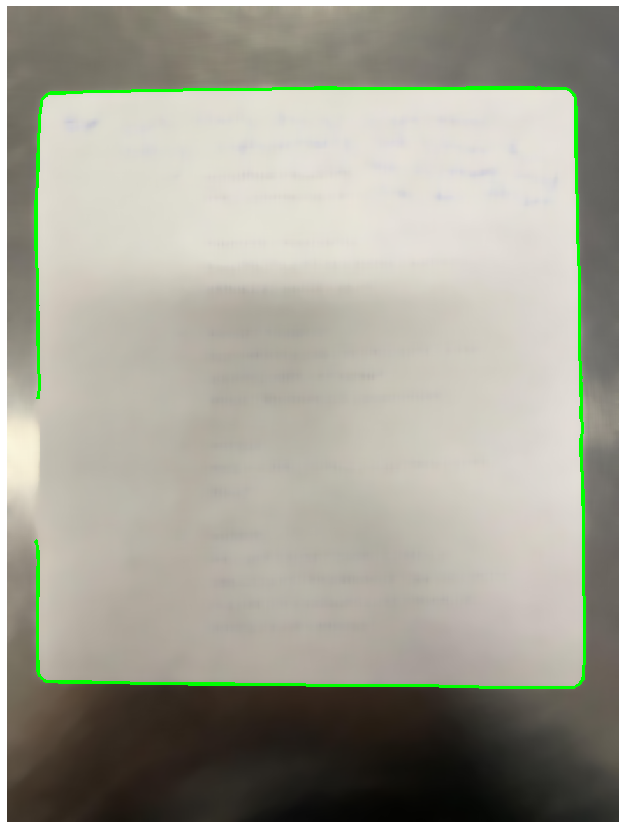

In [124]:
display(cv2.drawContours(blurred, conts, 4, (0,255,0), 3))

In [115]:
# https://docs.opencv.org/3.4/da/d0c/tutorial_bounding_rects_circles.html
# https://docs.opencv.org/3.4/dd/d49/tutorial_py_contour_features.html
epsilon = 0.1*cv2.arcLength(conts[4],True)
approx = cv2.approxPolyDP(conts[4],epsilon,True)

In [116]:
approx

array([[[  61,  139]],

       [[ 898, 1063]]], dtype=int32)

In [109]:
conts[1]

array([[[ 45, 648]],

       [[ 45, 649]],

       [[ 47, 651]],

       [[ 47, 652]],

       [[ 48, 653]],

       [[ 48, 654]],

       [[ 50, 656]],

       [[ 50, 744]],

       [[ 49, 745]],

       [[ 49, 750]],

       [[ 48, 751]],

       [[ 48, 753]],

       [[ 47, 754]],

       [[ 47, 756]],

       [[ 46, 757]],

       [[ 46, 758]],

       [[ 44, 760]],

       [[ 44, 764]],

       [[ 44, 760]],

       [[ 46, 758]],

       [[ 46, 757]],

       [[ 47, 756]],

       [[ 47, 755]],

       [[ 48, 754]],

       [[ 48, 751]],

       [[ 49, 750]],

       [[ 49, 745]],

       [[ 50, 744]],

       [[ 50, 656]],

       [[ 48, 654]],

       [[ 48, 652]],

       [[ 45, 649]]], dtype=int32)

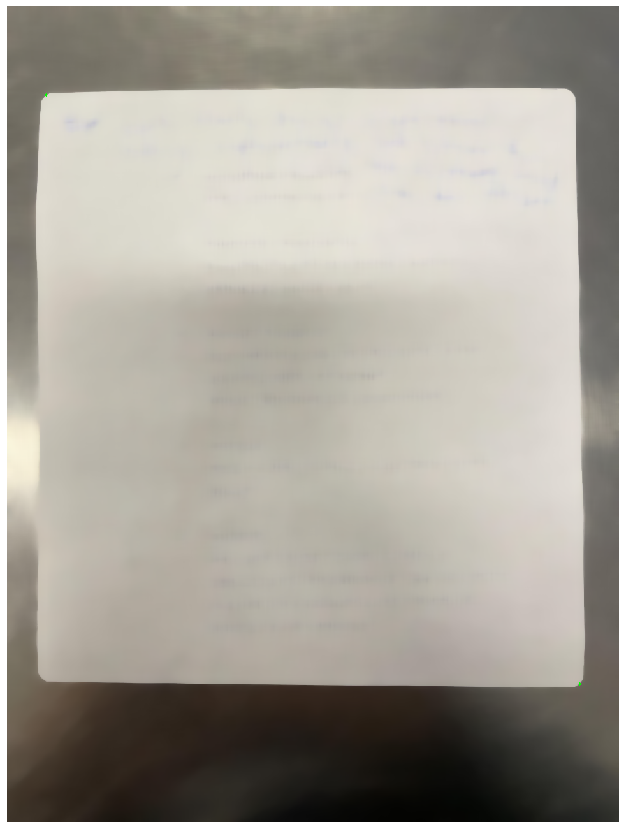

In [121]:
display(cv2.drawContours(blurred, approx, -1, (0,255,0), 3))

In [119]:
import copy

In [123]:
for i in conts:
    print(cv2.contourArea(i,True))

0.0
-2.0
0.0
-1.0
-35.5


The second method involves using the hough transform to find the edges of the paper and then finding their intersections. This method ended up working well for me. A commenter also suggested using the standard hough transform rather than the probabilistic because it returns a line in polar form, which allows me to easily find parallel ones.

In [156]:
# https://docs.opencv.org/3.4/d9/db0/tutorial_hough_lines.html
lines = cv2.HoughLines(np.uint8(edge_blurred), 1, 2*np.pi / 180, 150, None, 0, 0)
# the example gave only 1 degree of allowance, but I gave more to merge duplicate lines

In [157]:
import math
line_image = copy.copy(image)
if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 2000*(-b)), int(y0 + 2000*(a)))
        pt2 = (int(x0 - 2000*(-b)), int(y0 - 2000*(a)))
        cv2.line(line_image, pt1, pt2, (0,0,255), 2, cv2.LINE_AA)

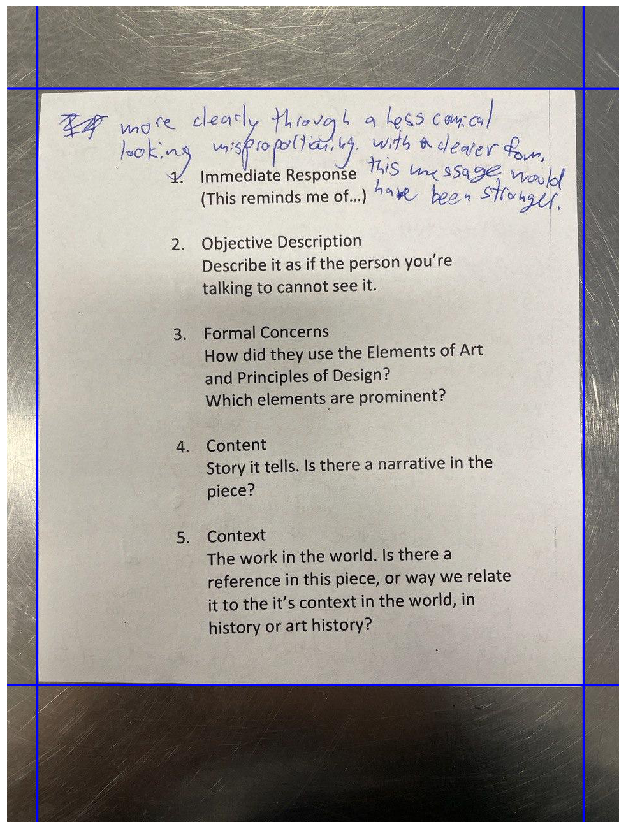

In [158]:
display(line_image)

Beautiful!

In [159]:
lines

array([[[ 129.       ,    1.5707964]],

       [[  47.       ,    0.       ]],

       [[ 904.       ,    0.       ]],

       [[1065.       ,    1.5707964]]], dtype=float32)

In [152]:
lines[0][0][0] = 300
lines[1][0][0] = 200

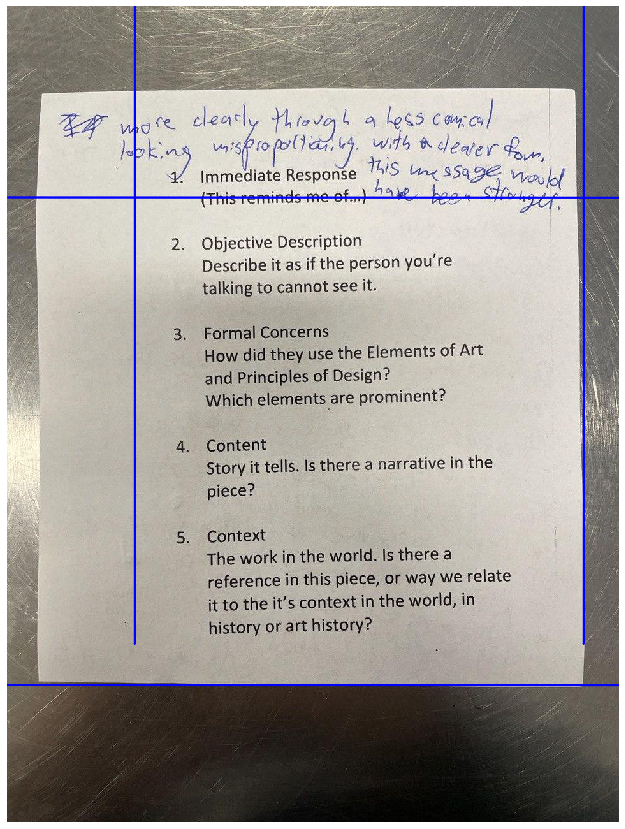

In [153]:
line_image = copy.copy(image)
for i in range(0, len(lines)):
    rho = lines[i][0][0]
    theta = lines[i][0][1]
    a = math.cos(theta)
    b = math.sin(theta)
    x0 = a * rho
    y0 = b * rho
    pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
    pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
    cv2.line(line_image, pt1, pt2, (0,0,255), 2, cv2.LINE_AA)
display(line_image)

Here I tried to sort the lines so I could match up parallel ones as opposite sides of the paper.

In [161]:
if len(lines) == 4:
    print(lines[lines[:, :, 1].argsort()])

[[[[129.          1.5707964]]]


 [[[129.          1.5707964]]]


 [[[129.          1.5707964]]]


 [[[129.          1.5707964]]]]


In [171]:
np.sort(lines, axis=2)

array([[[   1.5707964,  129.       ]],

       [[   0.       ,   47.       ]],

       [[   0.       ,  904.       ]],

       [[   1.5707964, 1065.       ]]], dtype=float32)

In [174]:
slines = np.squeeze(lines)
slines

array([[ 129.       ,    1.5707964],
       [  47.       ,    0.       ],
       [ 904.       ,    0.       ],
       [1065.       ,    1.5707964]], dtype=float32)

In [184]:
slines = slines[slines[:, 1].argsort()]
slines

array([[  47.       ,    0.       ],
       [ 904.       ,    0.       ],
       [ 129.       ,    1.5707964],
       [1065.       ,    1.5707964]], dtype=float32)

Now that I had the lines in order, I needed to find the intersections between each of them. For that I found a function online and then made a few edits to suit it to this. 

In [210]:
# https://stackoverflow.com/questions/46565975/find-intersection-point-of-two-lines-drawn-using-houghlines-opencv
def intersection(line1, line2):
    """Finds the intersection of two lines given in Hesse normal form.

    Returns closest integer pixel locations.
    See https://stackoverflow.com/a/383527/5087436
    """
    rho1, theta1 = line1
    rho2, theta2 = line2
    A = np.array([
        [np.cos(theta1), np.sin(theta1)],
        [np.cos(theta2), np.sin(theta2)]
    ])
    b = np.array([[rho1], [rho2]])
    x0, y0 = np.linalg.solve(A, b)
    x0, y0 = int(np.round(x0)), int(np.round(y0))
    return [x0, y0]


def segmented_intersections(lines1, lines2):
    """Finds the intersections between groups of lines."""

    intersections = []
    for i in lines1:
        for j in lines2:
            intersections.append(intersection(i, j)) 

    return np.array(intersections).astype(np.float32)

In [211]:
interxs = segmented_intersections(slines[:2], slines[2:])

In [212]:
interxs

array([[  47.,  129.],
       [  47., 1065.],
       [ 904.,  129.],
       [ 904., 1065.]], dtype=float32)

Now that I had my quadrilateral corners, I needed to turn it into a normal rectangle. I learned that this is actually called a perspective transform. I also found two [stack](https://stackoverflow.com/questions/3190483/transform-quadrilateral-into-a-rectangle) [overflow](https://stackoverflow.com/questions/2351586/iphone-image-stretching-skew) pages which explain the math of this really well. First I needed to find the matrix that would do this transformation, and then apply it. Fortunately cv2 already had functions for both of these actions.

In [213]:
dst_points = np.array([[0,0], [0, 900], [850, 0], [850, 900]]).astype(np.float32)

In [216]:
# https://docs.opencv.org/3.4/da/d54/group__imgproc__transform.html#ga15302cbff82bdcddb70158a58b73d981
# https://docs.opencv.org/3.4/de/dd4/samples_2cpp_2warpPerspective_demo_8cpp-example.html#a26
# https://theailearner.com/tag/cv2-warpperspective/
M = cv2.getPerspectiveTransform(interxs, dst_points)
M

array([[ 9.91831972e-01,  8.80059522e-18, -4.66161027e+01],
       [ 0.00000000e+00,  9.61538462e-01, -1.24038462e+02],
       [-5.52736473e-20,  5.05491094e-37,  1.00000000e+00]])

In [222]:
warped_image_size = np.array([850, 900])

In [223]:
warped = cv2.warpPerspective(image, M, warped_image_size)
warped

array([[[129, 125, 114],
        [117, 113, 102],
        [117, 113, 102],
        ...,
        [107, 106, 102],
        [ 87,  86,  82],
        [ 87,  86,  82]],

       [[113, 109,  98],
        [114, 110,  99],
        [116, 112, 101],
        ...,
        [102, 101,  97],
        [ 98,  97,  93],
        [ 98,  97,  93]],

       [[106, 102,  91],
        [107, 103,  92],
        [109, 105,  94],
        ...,
        [ 91,  90,  86],
        [104, 103,  99],
        [109, 108, 104]],

       ...,

       [[115, 103,  87],
        [103,  94,  79],
        [117, 107,  93],
        ...,
        [188, 184, 173],
        [204, 200, 189],
        [131, 127, 116]],

       [[113, 101,  85],
        [117, 106,  92],
        [125, 113,  99],
        ...,
        [187, 183, 172],
        [199, 195, 184],
        [119, 115, 104]],

       [[110,  98,  82],
        [115, 103,  89],
        [112, 100,  86],
        ...,
        [166, 162, 151],
        [207, 203, 192],
        [110, 106,  95]]

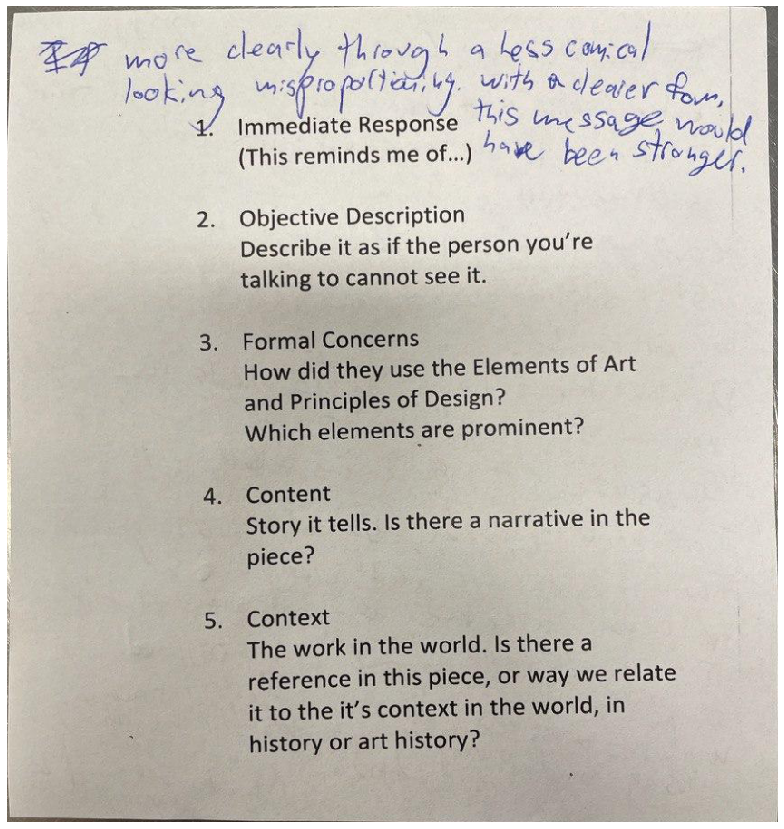

In [224]:
display(warped)

It worked! This was exactly what I was looking for. Now the only step left was to do thresholding to make it black and white. I experimented with a few types of thresholding, both with and without blurring.

In [243]:
gray_warped = np.uint8(color.rgb2gray(warped)*255)

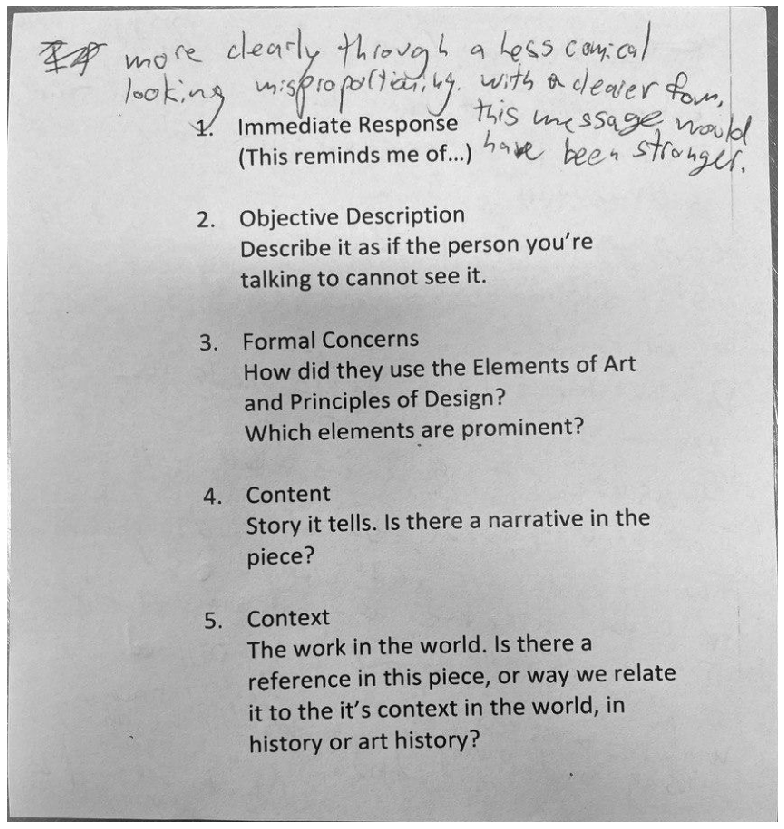

In [244]:
display(gray_warped)

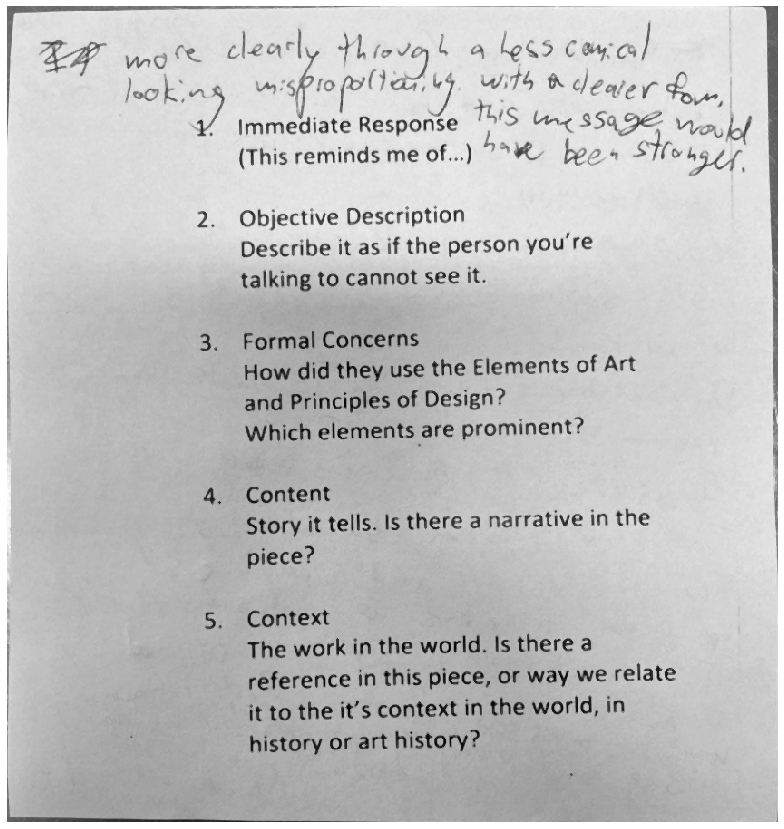

In [252]:
median_gray_warped = blurred = cv2.medianBlur(gray_warped, 3)
display(median_gray_warped)

In [268]:
threshed = cv2.adaptiveThreshold(gray_warped,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,301,2)
median_threshed = cv2.adaptiveThreshold(median_gray_warped,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,301,2)

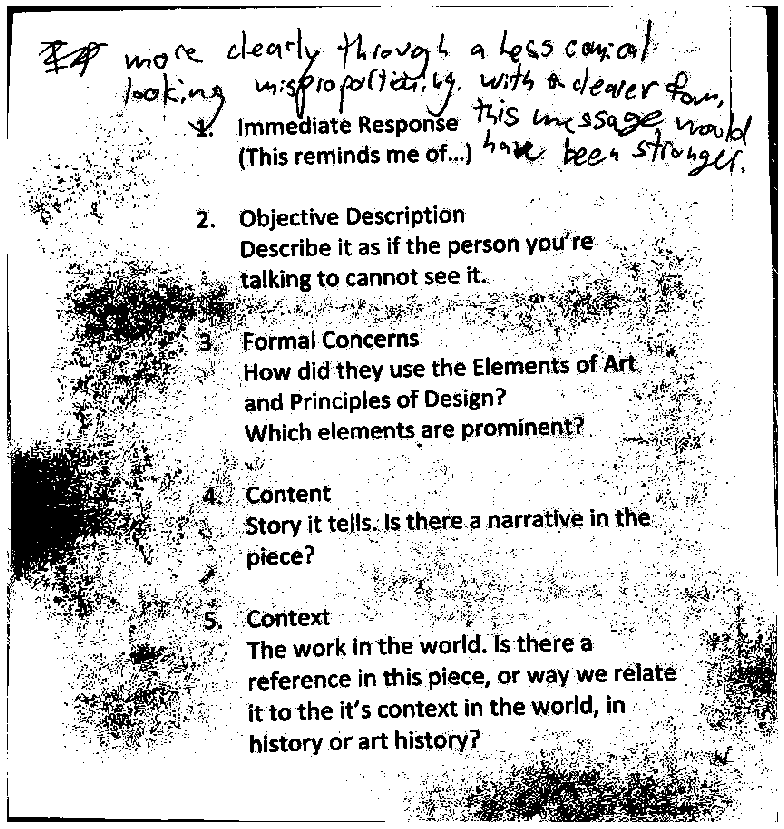

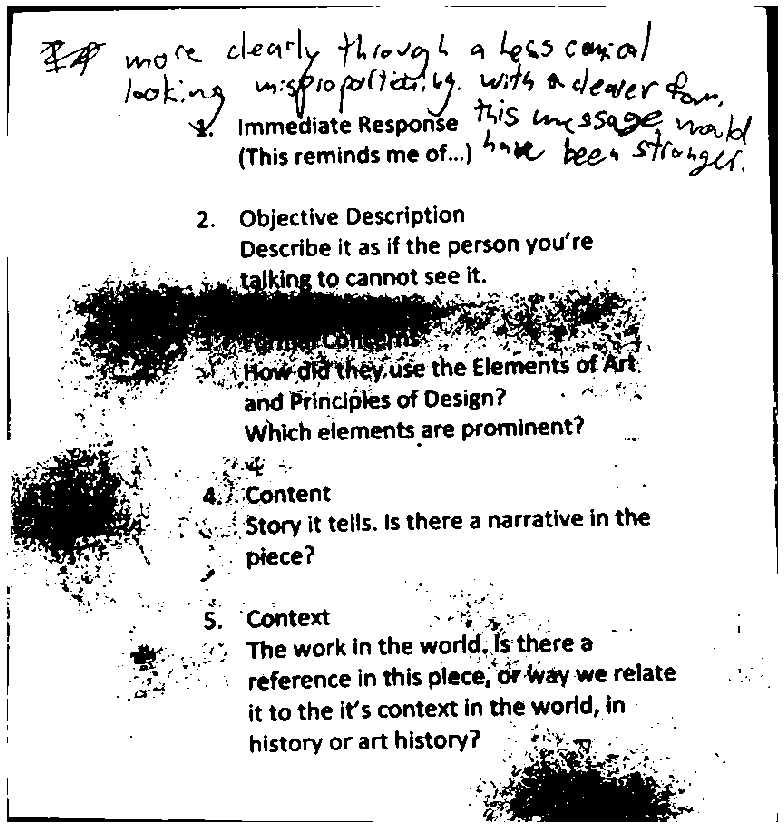

In [269]:
display(threshed)
display(median_threshed)

In [276]:
_, simple_threshed = cv2.threshold(gray_warped,127,255,cv2.THRESH_BINARY)
_, otsu_threshed = cv2.threshold(gray_warped,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

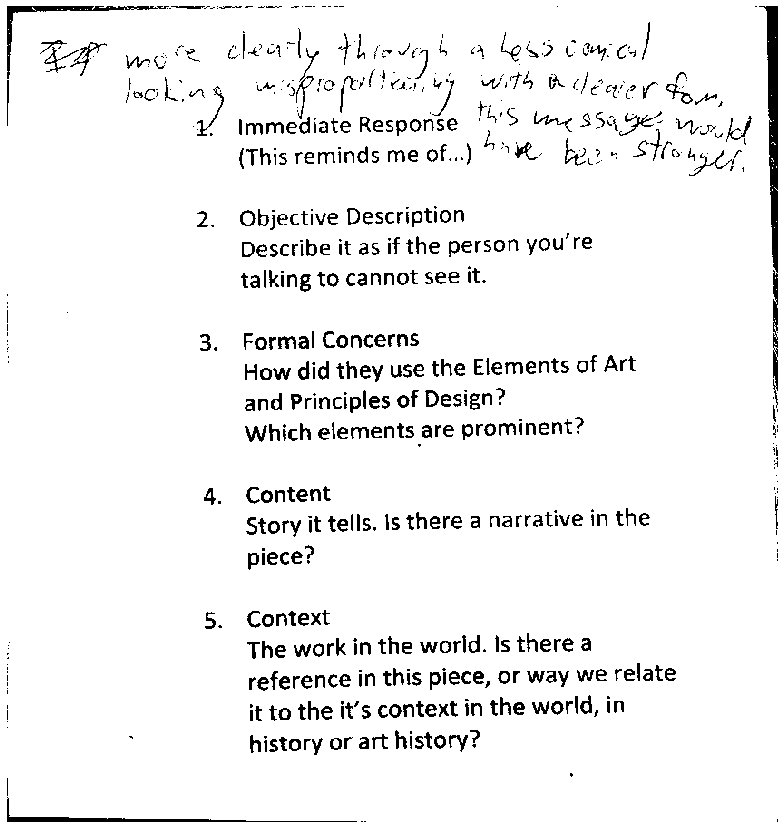

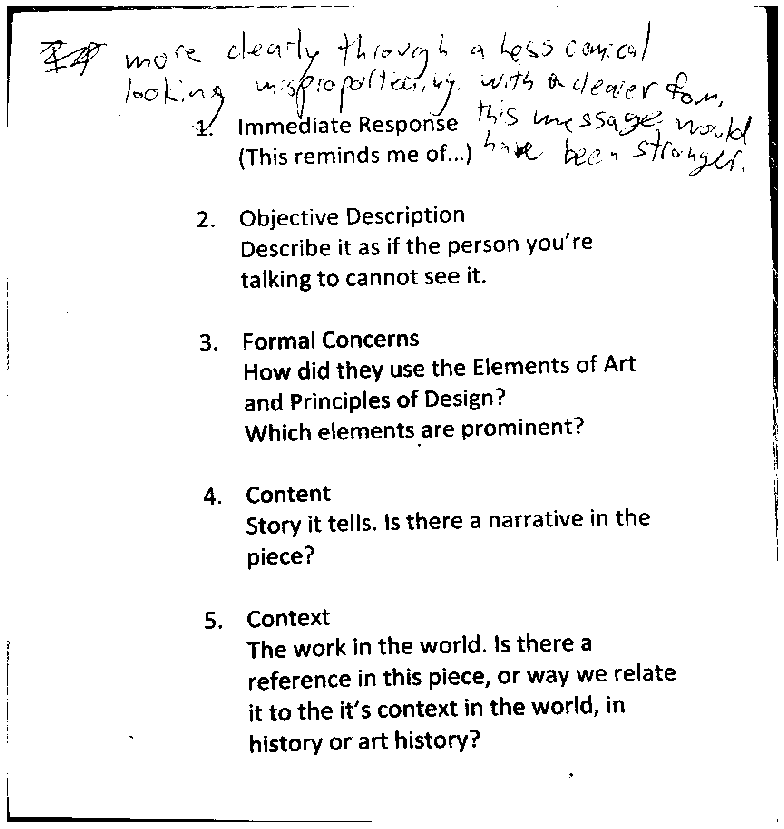

In [277]:
display(simple_threshed)
display(otsu_threshed)

Surprisingly, simple thresholding and simple thresholding with Otsu binarization worked the best out of all the thresholding techniques, though they're the simplest. I decided that next, I wanted to consolidate these steps all into one function which returns the scan of a paper in an image.

In the process of doing this, I encountered a few issues. One was with the hough transform finding too many lines. So solve this I made it so it increases the tolerance of the function until it finds only 4 lines. Another issue was finding a good resolution for the final image. I wanted to keep it a relatively similar resolution to the size of the paper in the image, so I just took the minimum side length in the image and scaled that according to the size of standard printer paper.

In [305]:
def scan_paper(img):
    blurred = cv2.medianBlur(img, 25)
    gray_blurred = color.rgb2gray(blurred) * 255
    edge_blurred = feature.canny(gray_blurred, sigma=0, low_threshold=20, high_threshold=40)
    
    lines = cv2.HoughLines(np.uint8(edge_blurred), 1, 2*np.pi / 180, 150, None, 0, 0)
    counter = 1
    while len(lines) > 4:
        lines = cv2.HoughLines(np.uint8(edge_blurred), 1, (2+counter)*np.pi / 180, 150, None, 0, 0)
    slines = np.squeeze(lines)
    slines = slines[slines[:, 0].argsort()]
    slines = slines[slines[:, 1].argsort()]
    interxs = segmented_intersections(slines[:2], slines[2:])
    
    scale = min(math.dist(interxs[0], interxs[1]),
                math.dist(interxs[1], interxs[3]),
                math.dist(interxs[2], interxs[3]),
                math.dist(interxs[0], interxs[2]))
    short = round(scale)
    long = round(scale * 11/8.5)
    
    dst_points = np.array([[0,0], [0, long], [short, 0], [short, long]]).astype(np.float32)
    M = cv2.getPerspectiveTransform(interxs, dst_points)
    warped_image_size = np.array([short, long])
    warped = cv2.warpPerspective(img, M, warped_image_size)
    
    return warped

In [279]:
math.dist([1,2], [3,8])

6.324555320336759

In [281]:
max(math.dist(interxs[0], interxs[1]), math.dist(interxs[1], interxs[2]))

1269.0724959591553

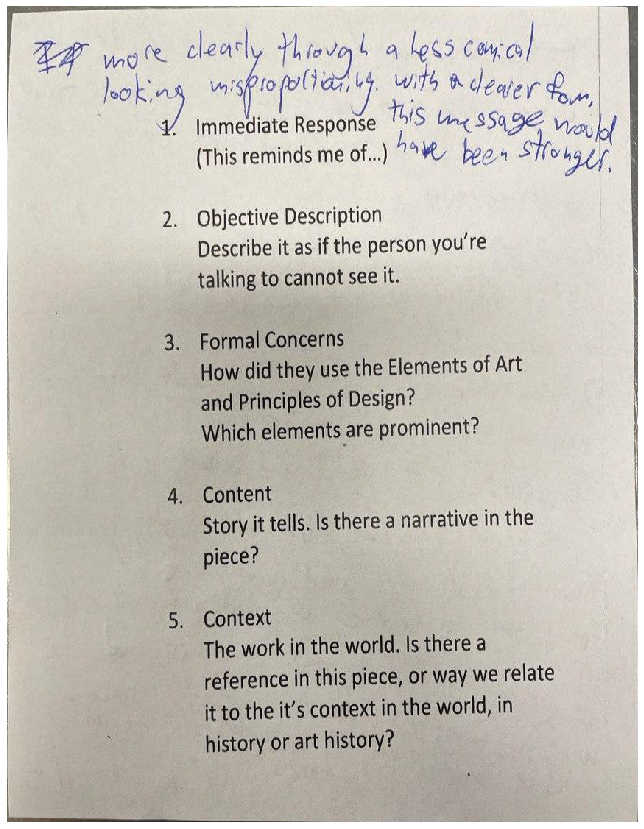

In [283]:
display(scan_paper(image))

Then I made all those changes to a function which also turns the scan black & white.

In [308]:
def scan_paper_bw(img):
    blurred = cv2.medianBlur(img, 25)
    gray_blurred = color.rgb2gray(blurred) * 255
    edge_blurred = feature.canny(gray_blurred, sigma=0, low_threshold=20, high_threshold=40)
    
    lines = cv2.HoughLines(np.uint8(edge_blurred), 1, 2*np.pi / 180, 150, None, 0, 0)
    counter = 1
    while len(lines) > 4:
        lines = cv2.HoughLines(np.uint8(edge_blurred), 1, (2+counter)*np.pi / 180, 150, None, 0, 0)
    slines = np.squeeze(lines)
    slines = slines[slines[:, 0].argsort()]
    slines = slines[slines[:, 1].argsort()]
    interxs = segmented_intersections(slines[:2], slines[2:])
    
    scale = min(math.dist(interxs[0], interxs[1]),
                math.dist(interxs[1], interxs[3]),
                math.dist(interxs[2], interxs[3]),
                math.dist(interxs[0], interxs[2]))
    short = round(scale)
    long = round(scale * 11/8.5)
    
    dst_points = np.array([[0,0], [0, long], [short, 0], [short, long]]).astype(np.float32)
    M = cv2.getPerspectiveTransform(interxs, dst_points)
    warped_image_size = np.array([short, long])
    warped = cv2.warpPerspective(img, M, warped_image_size)
    
    gray_warped = np.uint8(color.rgb2gray(warped)*255)
    _, otsu_threshed = cv2.threshold(gray_warped,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    return otsu_threshed

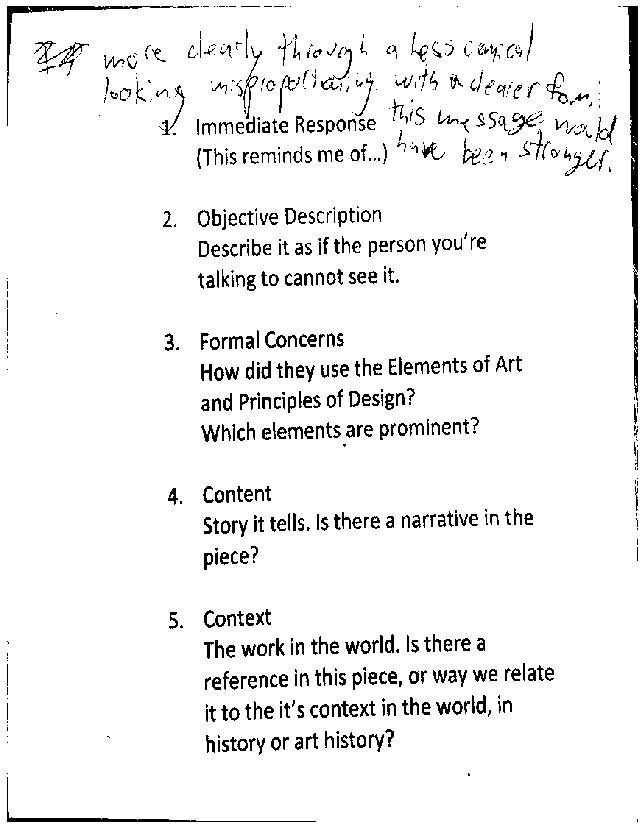

In [285]:
display(scan_paper_bw(image))

I wanted to try my scanner on another image as well.

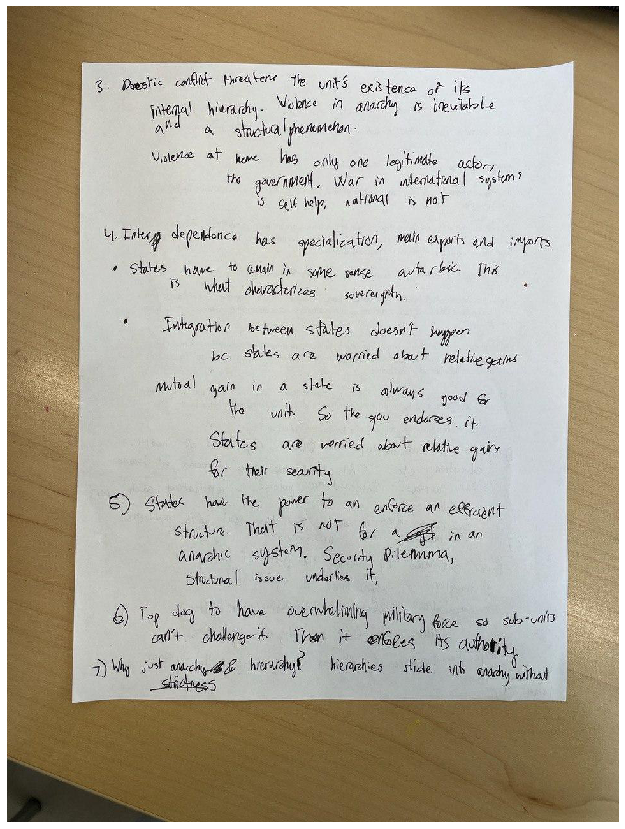

In [286]:
image2 = load('../FeatureDetection/CornerImages/photo_2021-11-05_11-06-34.jpg')
display(image2)

[[[1088.           1.5707964]]

 [[ 878.           0.       ]]

 [[ 113.           0.       ]]

 [[  89.           1.5707964]]]
[[ 113.   89.]
 [ 113. 1088.]
 [ 878.   89.]
 [ 878. 1088.]]
765.0 765 990


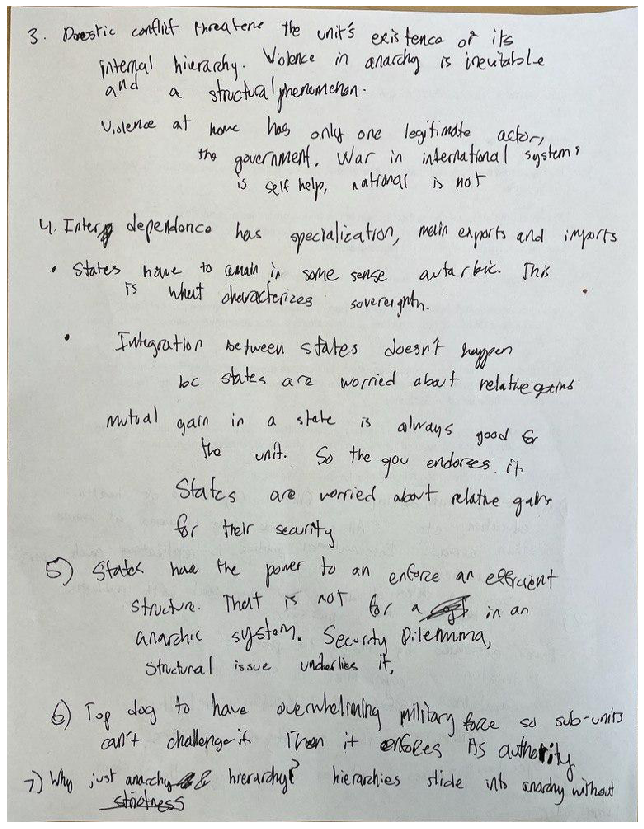

In [304]:
display(scan_paper(image2))

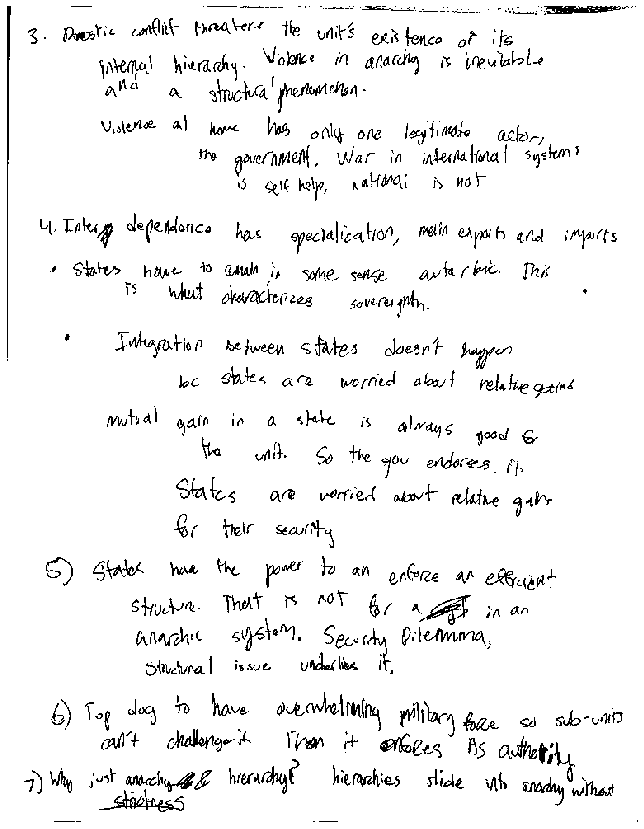

In [309]:
display(scan_paper_bw(image2))

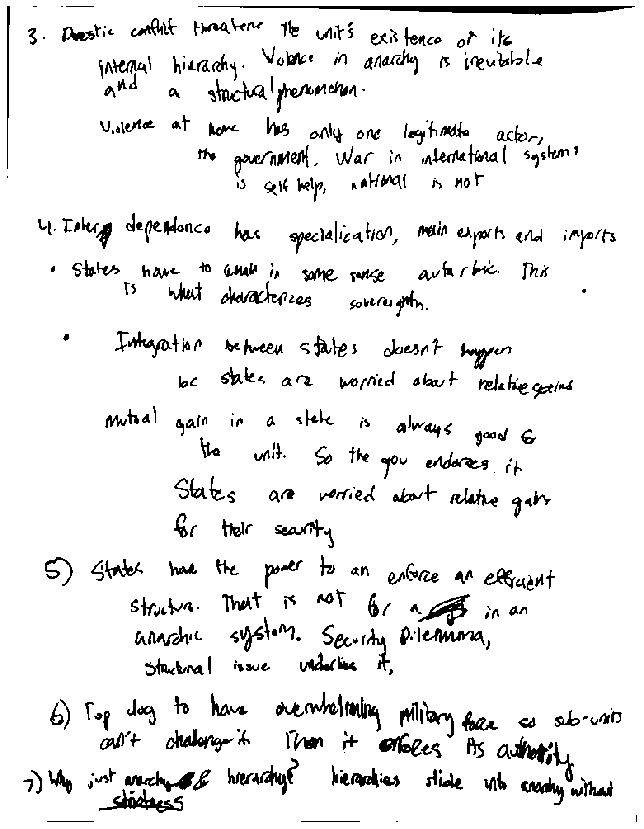

In [312]:
display(scan_paper_bw(cv2.GaussianBlur(image2, (3,3), 0)))

I wondered whether blurring the image at the start would help make the lines more solid, but it actually turned out worse. I'm very happy with how my scanner is right now.

In [291]:
def hough_lines(img):
    blurred = cv2.medianBlur(img, 25)
    gray_blurred = color.rgb2gray(blurred) * 255
    edge_blurred = feature.canny(gray_blurred, sigma=0, low_threshold=20, high_threshold=40)
    
    lines = cv2.HoughLines(np.uint8(edge_blurred), 1, 2*np.pi / 180, 150, None, 0, 0)
    line_image = copy.copy(img)
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 2000*(-b)), int(y0 + 2000*(a)))
        pt2 = (int(x0 - 2000*(-b)), int(y0 - 2000*(a)))
        cv2.line(line_image, pt1, pt2, (0,0,255), 2, cv2.LINE_AA)
    
    return line_image

This was where I encountered the issue of finding too many hough lines.

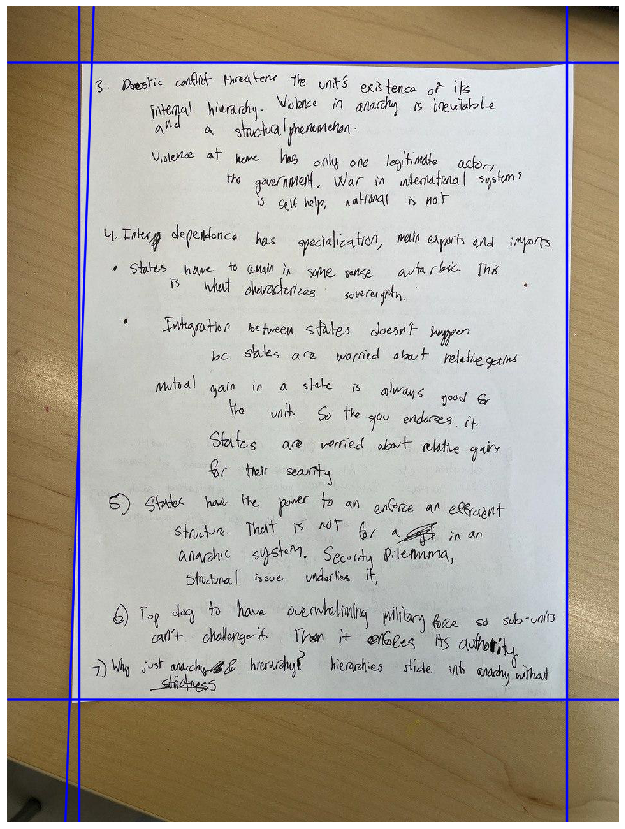

In [292]:
display(hough_lines(image2))

In [301]:
lines = [[[1088, 1.5707964]],
         [[ 878, 0]],
         [[ 113, 0]],
         [[  89, 1.5707964]]]
slines = np.squeeze(lines)
slines = slines[slines[:, 0].argsort()]
slines = slines[slines[:, 1].argsort()]

In [302]:
slines

array([[ 113.       ,    0.       ],
       [ 878.       ,    0.       ],
       [  89.       ,    1.5707964],
       [1088.       ,    1.5707964]])